In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
img = cv2.imread('DATA/00-puppy.jpg')

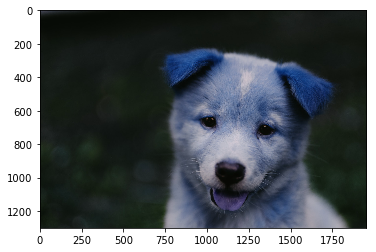

In [3]:
plt.imshow(img)

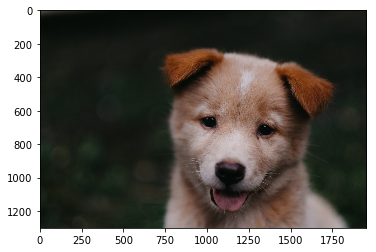

In [5]:
img = cv2.cvtColor(img , cv2.COLOR_BGR2RGB)
plt.imshow(img)

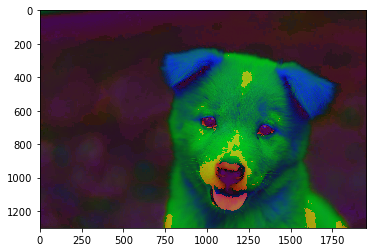

In [6]:
img = cv2.cvtColor(img , cv2.COLOR_RGB2HLS)
plt.imshow(img)

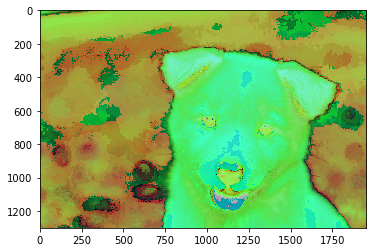

In [7]:
img = cv2.cvtColor(img , cv2.COLOR_RGB2HSV)
plt.imshow(img)

In [8]:
img1 =cv2.imread('DATA/dog_backpack.jpg')
img1 = cv2.cvtColor(img1 , cv2.COLOR_BGR2RGB)
img2 = cv2.imread('DATA/watermark_no_copy.png')
img2 = cv2.cvtColor(img2 , cv2.COLOR_BGR2RGB)

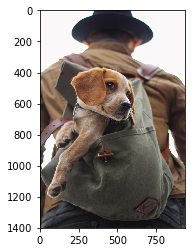

In [9]:
plt.imshow(img1)

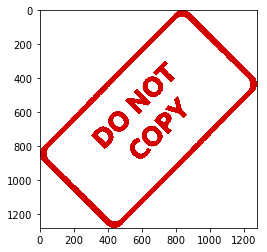

In [10]:
plt.imshow(img2)

In [11]:
# RESIZING THE TWO IMAGES 

img1 = cv2.resize(img1 , (1200,1200))
img2 = cv2.resize(img2 , (1200,1200))


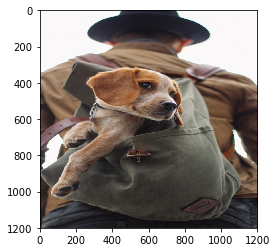

In [12]:
plt.imshow(img1)

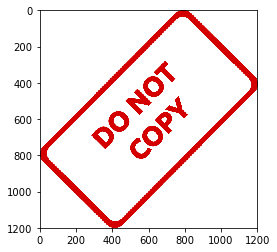

In [13]:
plt.imshow(img2)

In [14]:
# BLENDING TWO IMAGES OVER EACH OTHERS
# addWeighted is only working with the same size images
blended = cv2.addWeighted(src1 = img1 , alpha = 0.7 ,src2 = img2 , beta = 0.3 , gamma = 0)

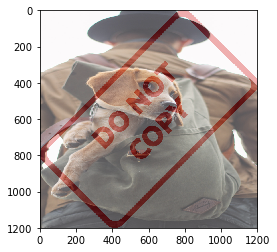

In [15]:
plt.imshow(blended)

In [16]:
# IF THE IMAGES WRE DIFFERENT IN SIZE WO WE CAN'T BLEND THEM BUT WE WILL PUT ONE ONTO ANOTHER

img1 =cv2.imread('DATA/dog_backpack.jpg')
img1 = cv2.cvtColor(img1 , cv2.COLOR_BGR2RGB)
img2 = cv2.imread('DATA/watermark_no_copy.png')
img2 = cv2.cvtColor(img2 , cv2.COLOR_BGR2RGB)

In [17]:
img2 = cv2.resize(img2 , (600,600))

In [18]:
large_img = img1
small_img = img2

In [19]:
x_offset = 0
y_offset = 0


In [20]:
x_end = x_offset + small_img.shape[1]
y_end = y_offset + small_img.shape[0]

In [21]:
large_img[y_offset:y_end,x_offset:x_end]=small_img

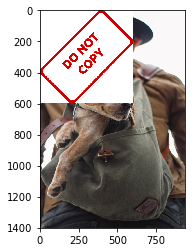

In [22]:
plt.imshow(large_img)

In [23]:
# TO PUT THE IMAGE OVER ANOTHER WITHOUT DISAPPEARING OF THE UNDERNEATH IMAGE


img1 =cv2.imread('DATA/dog_backpack.jpg')
img1 = cv2.cvtColor(img1 , cv2.COLOR_BGR2RGB)
img2 = cv2.imread('DATA/watermark_no_copy.png')
img2 = cv2.cvtColor(img2 , cv2.COLOR_BGR2RGB)

In [24]:
img2 = cv2.resize(img2 , (600,600))

In [25]:
img1.shape

(1401, 934, 3)

In [26]:
x_offset = 934 - 600
y_offset = 1401 - 600

In [27]:
img2.shape


(600, 600, 3)

In [28]:
rows,cols,channels = img2.shape

In [29]:
roi = img1[y_offset : 1401 , x_offset : 934]

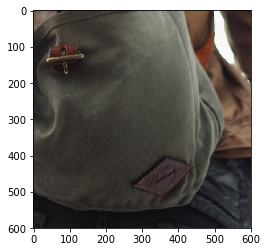

In [30]:
plt.imshow(roi)

In [31]:
img2gray = cv2.cvtColor(img2,cv2.COLOR_RGB2GRAY)


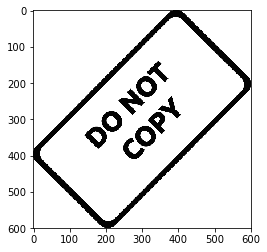

In [33]:
plt.imshow(img2gray , cmap ='gray')

In [34]:
mask_inv = cv2.bitwise_not(img2gray)

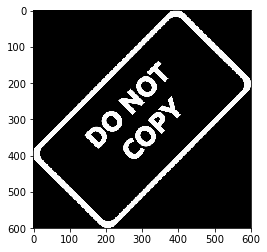

In [36]:
plt.imshow(mask_inv ,cmap = 'gray')

In [37]:
mask_inv.shape

(600, 600)

In [39]:
white_background = np.full(img2.shape , 255 , dtype = np.uint8)

In [40]:
bk = cv2.bitwise_or(white_background , white_background ,mask =mask_inv)

In [41]:
bk.shape

(600, 600, 3)

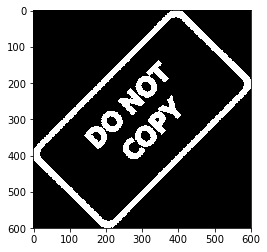

In [42]:
plt.imshow(bk)

In [43]:
fg = cv2.bitwise_or(img2,img2,mask = mask_inv)

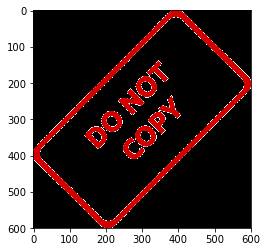

In [44]:
plt.imshow(fg)

In [45]:
final_roi = cv2.bitwise_or(roi,fg)

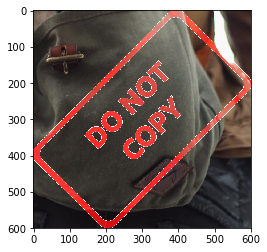

In [46]:
plt.imshow(final_roi)

In [47]:
large_img = img1
small_img = final_roi

In [48]:
large_img[y_offset:y_offset+small_img.shape[0],x_offset:x_offset+small_img.shape[1]]=small_img

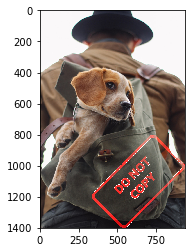

In [49]:
plt.imshow(large_img)

In [1]:
#IMAGE THRESHOLDING


In [3]:
img = cv2.imread('DATA/rainbow.jpg',0)

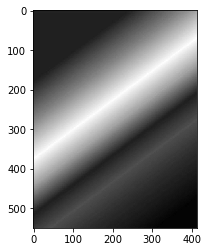

In [5]:
plt.imshow(img , cmap ='gray')

In [6]:
ret , th1 = cv2.threshold(img,127,255,cv2.THRESH_BINARY)


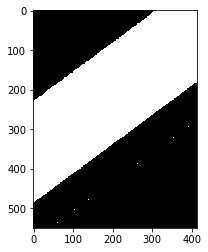

In [8]:
plt.imshow(th1 , cmap = 'gray')

In [9]:
ret , th2 = cv2.threshold(img,127,255,cv2.THRESH_BINARY_INV)


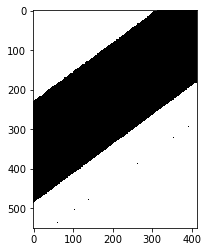

In [11]:
plt.imshow(th2,cmap = 'gray')

In [12]:
ret , th3 = cv2.threshold(img,127,255,cv2.THRESH_TOZERO)

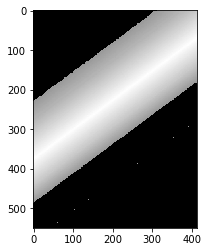

In [13]:
plt.imshow(th3 , cmap ='gray')

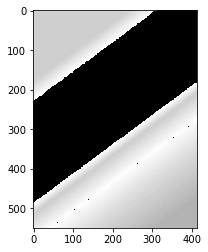

In [14]:
ret , th4 = cv2.threshold(img,127,255,cv2.THRESH_TOZERO_INV)
plt.imshow(th4 , cmap = 'gray')

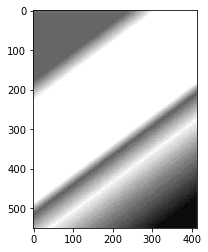

In [15]:
ret , th5 = cv2.threshold(img,127,255,cv2.THRESH_TRUNC)
plt.imshow(th5 , cmap = 'gray')

## ADAPTIVE THRESHOLD


In [16]:
img  = cv2.imread('DATA/crossword.jpg' , 0)

In [17]:
def show_pic(img):
    fig = plt.figure(figsize=(15,15))
    ax = fig.add_subplot(111)
    ax.imshow(img ,cmap ='gray')

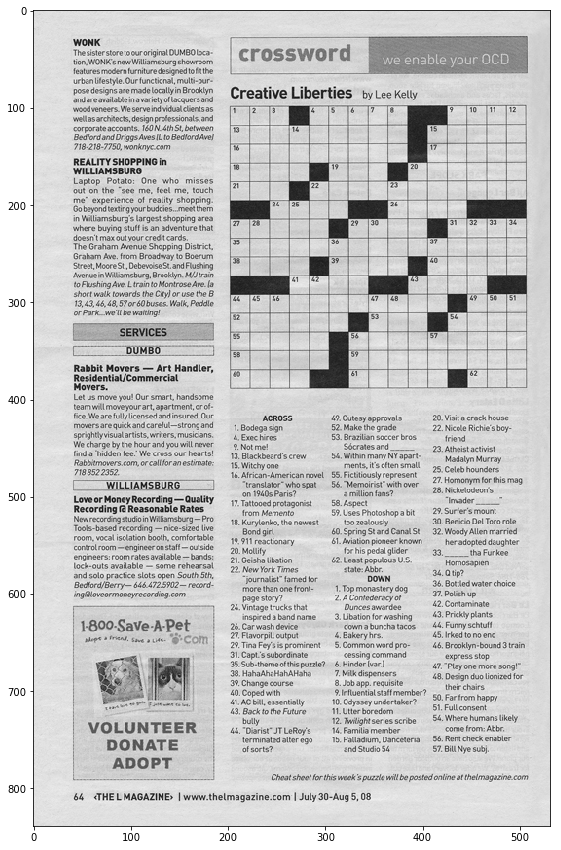

In [18]:
show_pic(img)

## SIMPLE BINARY

In [19]:
ret , th1 = cv2.threshold(img, 127,255,cv2.THRESH_BINARY)

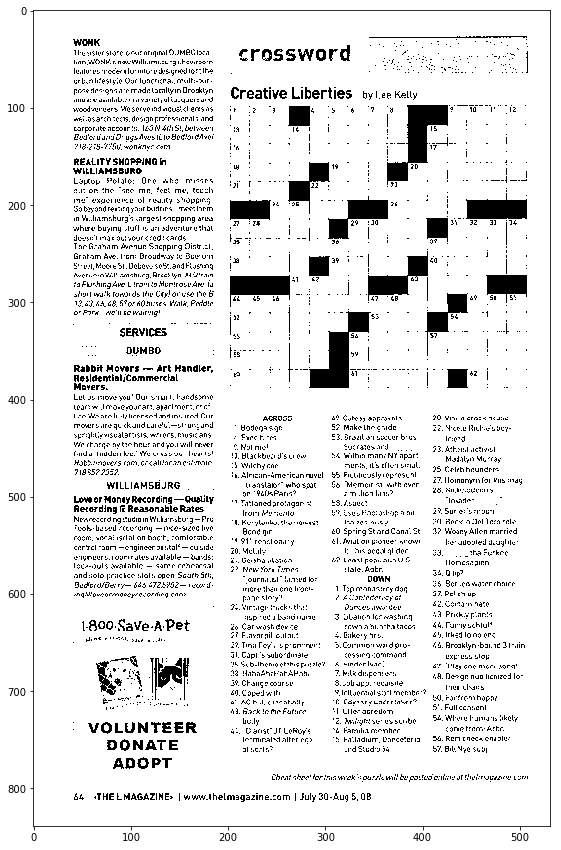

In [20]:
show_pic(th1)

## ADAPTIVE THRESHOLD


In [22]:
th2 = cv2.adaptiveThreshold(img , 255,cv2.ADAPTIVE_THRESH_MEAN_C , cv2.THRESH_BINARY , 11 , 8 )

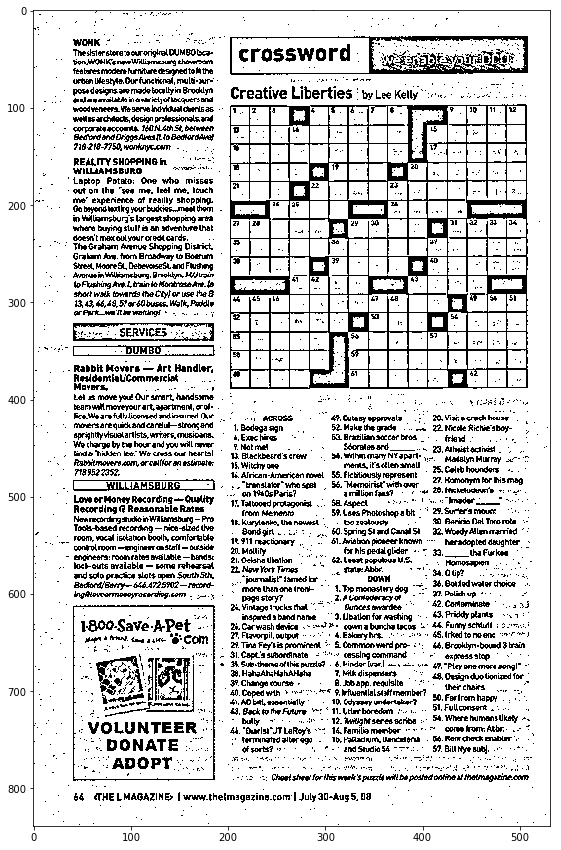

In [23]:
show_pic(th2)

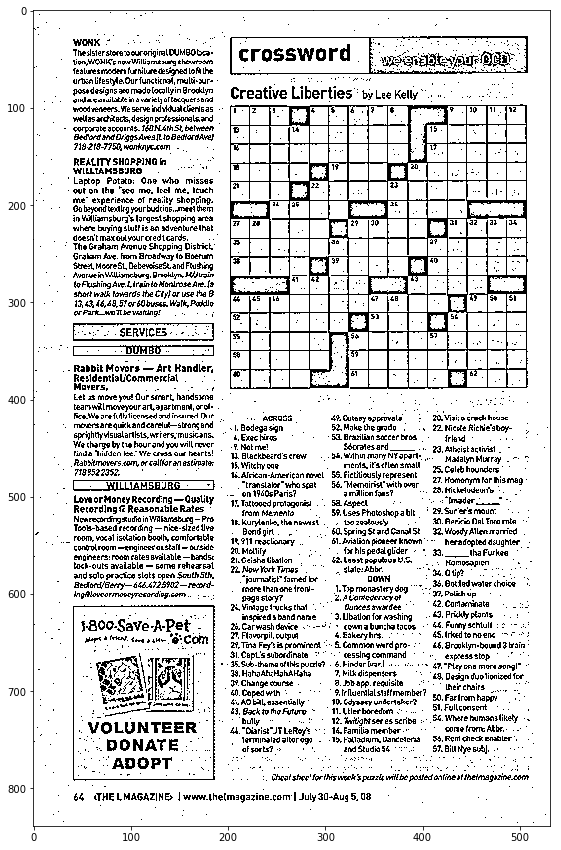

In [24]:
# BLENDING THE TH1 AND TH2 TOGETHER
th3 = cv2.adaptiveThreshold(img , 255 ,cv2.ADAPTIVE_THRESH_GAUSSIAN_C , cv2.THRESH_BINARY , 11 ,8)
show_pic(th3)


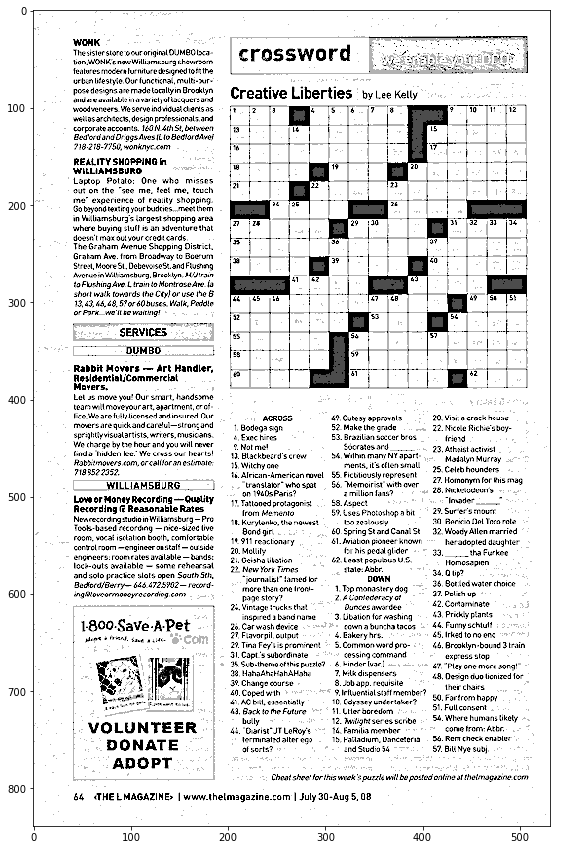

In [25]:
blended = cv2.addWeighted(src1 = th1 , alpha = 0.7 , src2 = th2,beta = 0.3 ,gamma = 0)
show_pic(blended)

## BLURRING AND SMOOTHING 

In [27]:
def load_img():
    img = cv2.imread('DATA/bricks.jpg').astype(np.float32) /255
    img = cv2.cvtColor(img , cv2.COLOR_BGR2RGB)
    return img


In [29]:
#load_img()



In [32]:
def display(img):
    fig = plt.figure(figsize=(12,10))
    ax = fig.add_subplot(111)
    ax.imshow(img)

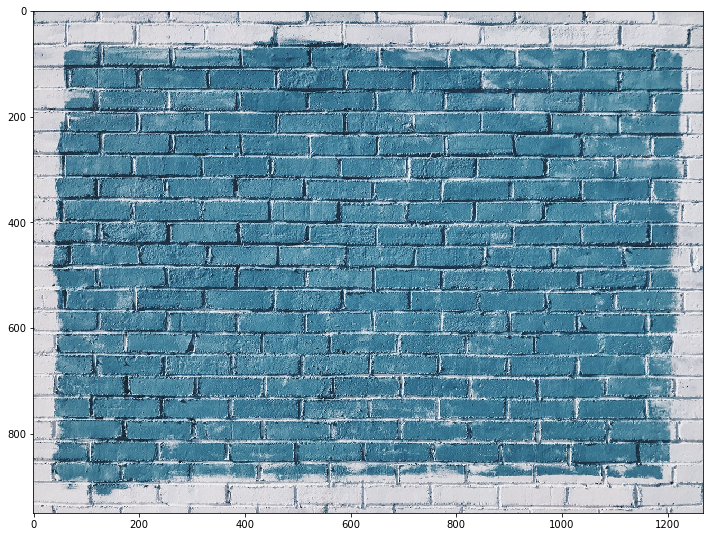

In [33]:
img = load_img()
display(img)


In [34]:
# if gamma < 1 ---> the image becomes lighter 
gamma = 1/4

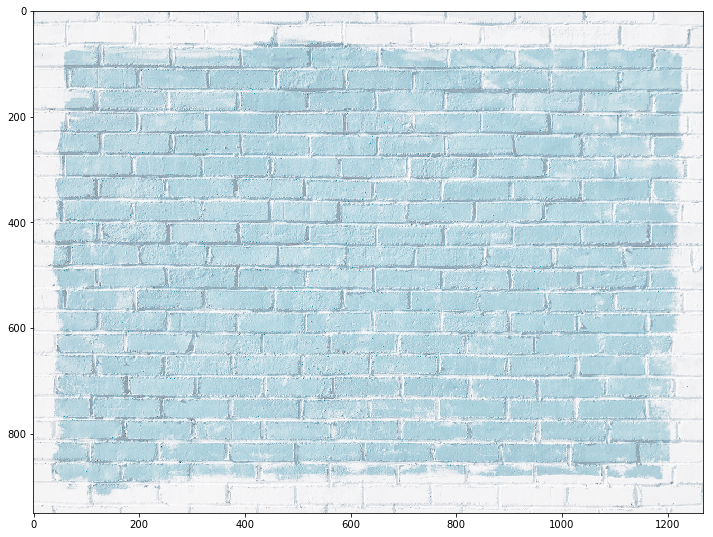

In [36]:
res = np.power(img,gamma)
display(res)

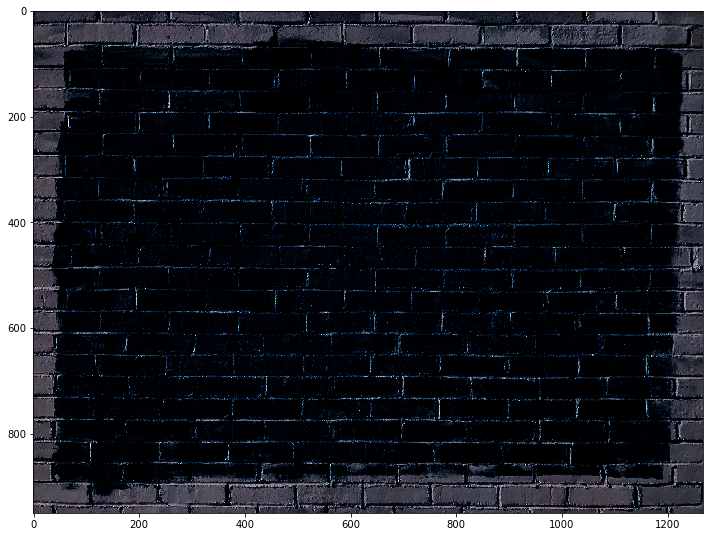

In [37]:
# if gamma  > 1  -----> the image becomes darker 
gamma = 8
res1 = np.power(img,gamma)
display(res1)

In [44]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text = 'bricks' ,org=(10,600),fontFace = font , fontScale = 10 , color =(255,0,0),thickness = 4)
  

array([[[0.7921569 , 0.78431374, 0.8039216 ],
        [0.7529412 , 0.77254903, 0.7882353 ],
        [0.7176471 , 0.76862746, 0.8       ],
        ...,
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ]],

       [[0.88235295, 0.8784314 , 0.8980392 ],
        [0.75686276, 0.78431374, 0.80784315],
        [0.69803923, 0.75686276, 0.78431374],
        ...,
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ]],

       [[0.8627451 , 0.8666667 , 0.8862745 ],
        [0.64705884, 0.68235296, 0.70980394],
        [0.48235294, 0.5372549 , 0.57254905],
        ...,
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ]],

       ...,

       [[0.8509804 , 0.83137256, 0.84705883],
        [0.84705883, 0.827451  , 0.84313726],
        [0.84313726, 0

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


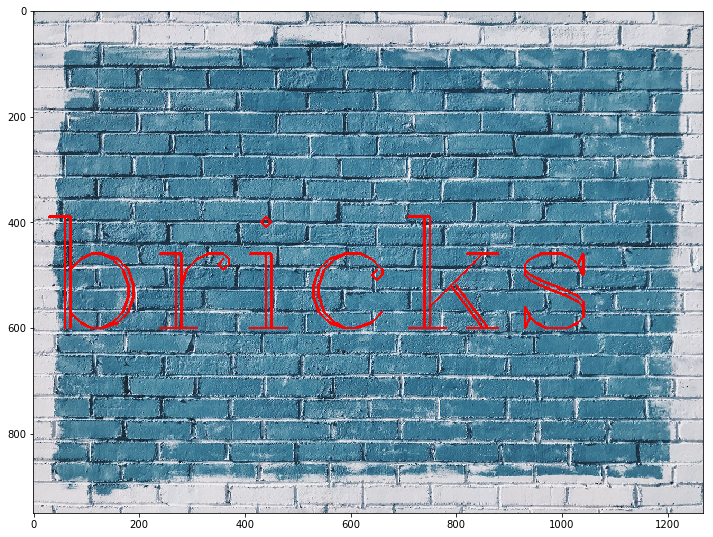

In [45]:
display(img)

In [46]:
# KERNEL BLURRING
kernel = np.ones(shape = (5,5) ,dtype=np.float32)/25

In [47]:
kernel

array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]], dtype=float32)

In [48]:
dst = cv2.filter2D(img , -1,kernel)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


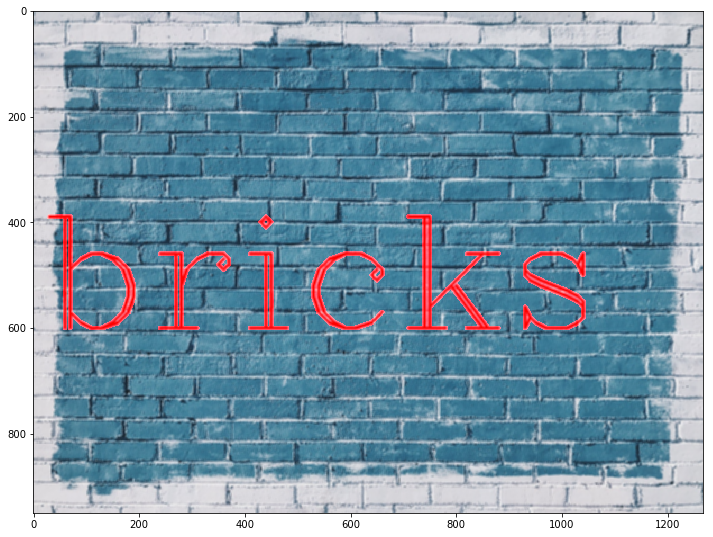

In [49]:
display(dst)

In [50]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text = 'bricks' ,org=(10,600),fontFace = font , fontScale = 10 , color =(255,0,0),thickness = 4)

array([[[0.7921569 , 0.78431374, 0.8039216 ],
        [0.7529412 , 0.77254903, 0.7882353 ],
        [0.7176471 , 0.76862746, 0.8       ],
        ...,
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ]],

       [[0.88235295, 0.8784314 , 0.8980392 ],
        [0.75686276, 0.78431374, 0.80784315],
        [0.69803923, 0.75686276, 0.78431374],
        ...,
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ]],

       [[0.8627451 , 0.8666667 , 0.8862745 ],
        [0.64705884, 0.68235296, 0.70980394],
        [0.48235294, 0.5372549 , 0.57254905],
        ...,
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ]],

       ...,

       [[0.8509804 , 0.83137256, 0.84705883],
        [0.84705883, 0.827451  , 0.84313726],
        [0.84313726, 0

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


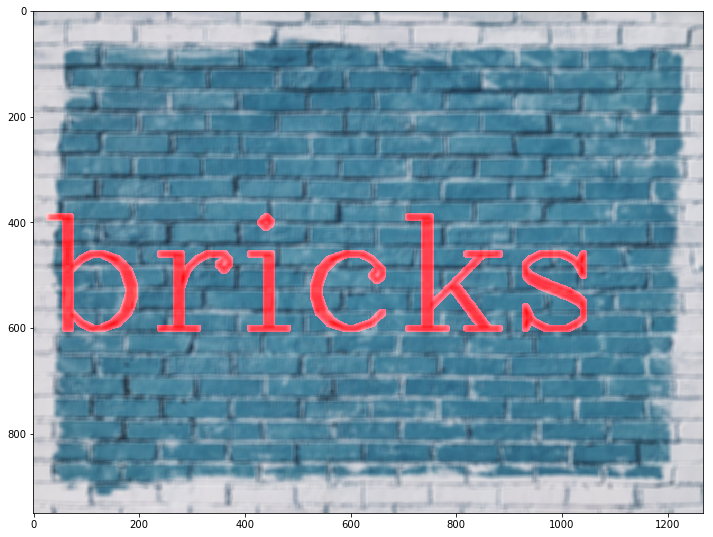

In [52]:
blurred = cv2.blur(img , ksize = (10,10))
display(blurred)

In [53]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text = 'bricks' ,org=(10,600),fontFace = font , fontScale = 10 , color =(255,0,0),thickness = 4)


array([[[0.7921569 , 0.78431374, 0.8039216 ],
        [0.7529412 , 0.77254903, 0.7882353 ],
        [0.7176471 , 0.76862746, 0.8       ],
        ...,
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ]],

       [[0.88235295, 0.8784314 , 0.8980392 ],
        [0.75686276, 0.78431374, 0.80784315],
        [0.69803923, 0.75686276, 0.78431374],
        ...,
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ]],

       [[0.8627451 , 0.8666667 , 0.8862745 ],
        [0.64705884, 0.68235296, 0.70980394],
        [0.48235294, 0.5372549 , 0.57254905],
        ...,
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ]],

       ...,

       [[0.8509804 , 0.83137256, 0.84705883],
        [0.84705883, 0.827451  , 0.84313726],
        [0.84313726, 0

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


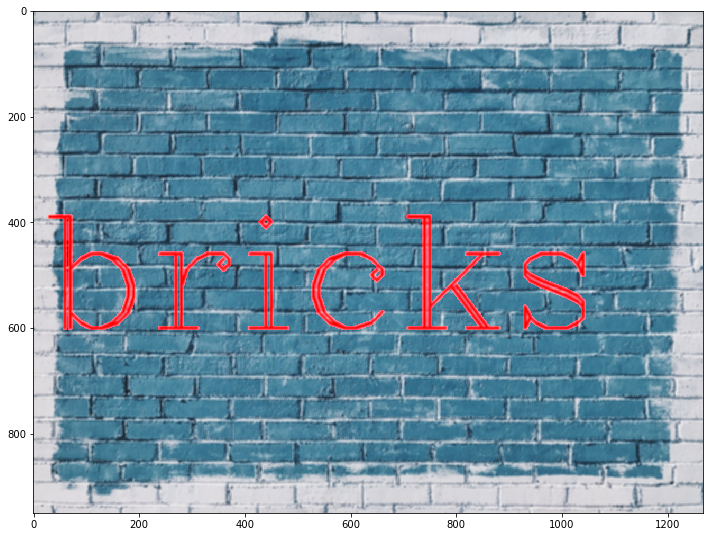

In [54]:
# BLURRING USING GAUSSIAN BLURRING
blurred_img = cv2.GaussianBlur(img,(5,5),10)
display(blurred_img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


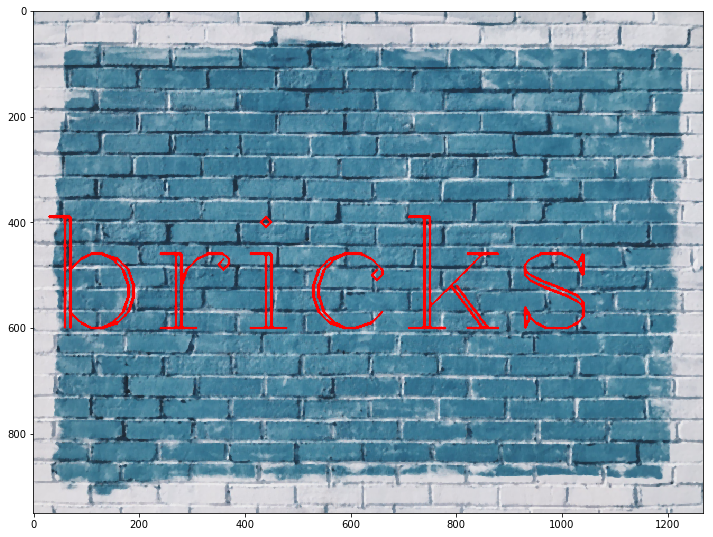

In [55]:
median_res = cv2.medianBlur(img,5)
display(median_res)

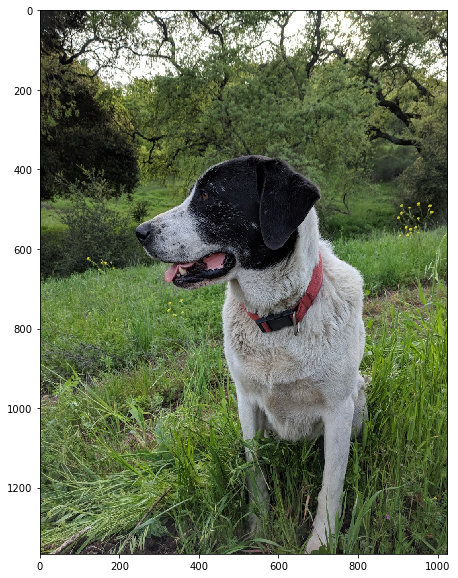

In [56]:
img = cv2.imread('DATA/sammy.jpg')
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
display(img)

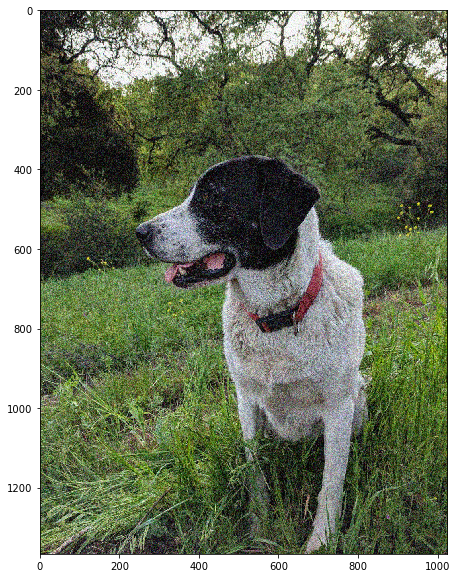

In [58]:
noise_img = cv2.imread('DATA/sammy_noise.jpg')
display(noise_img)

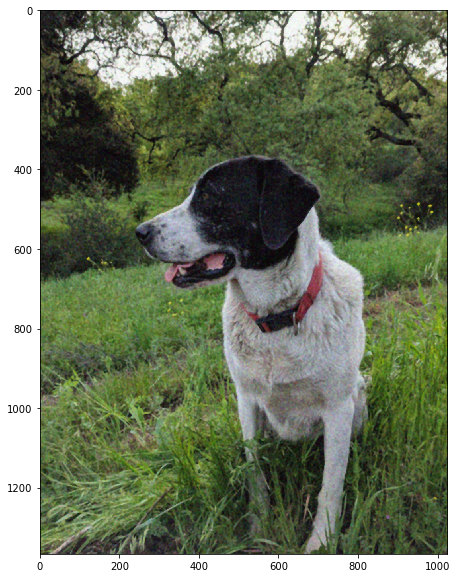

In [59]:
median = cv2.medianBlur(noise_img,5)
display(median)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


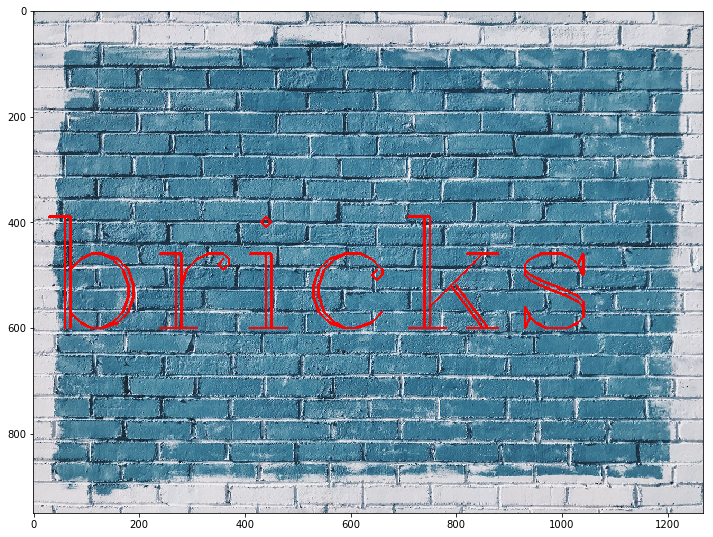

In [60]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text = 'bricks' ,org=(10,600),fontFace = font , fontScale = 10 , color =(255,0,0),thickness = 4)
display(img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


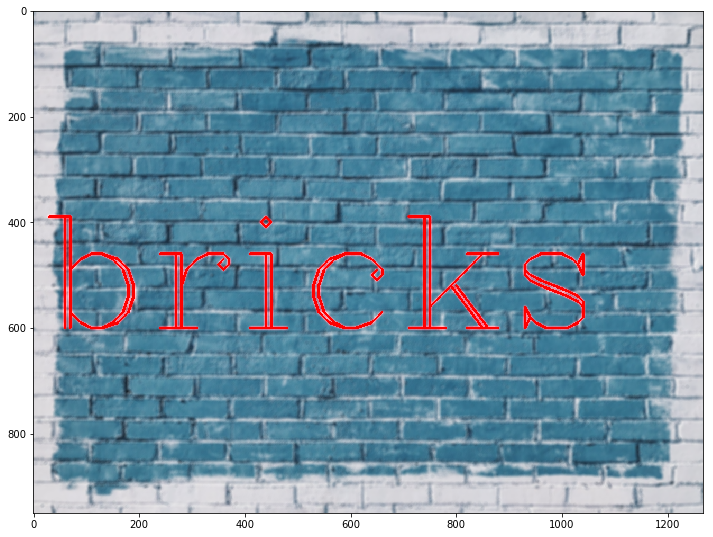

In [61]:
blur = cv2.bilateralFilter(img,9,75,75)
display(blur)

## MORPHOLOGICAL OPERATORS

In [66]:
def load_image():
    blank_img = np.zeros((600,600))
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(blank_img, text = 'ABCDE' , org = (50,300),fontFace = font , fontScale = 5 , color = (255,255,255),thickness=25,lineType=cv2.LINE_AA)
    return blank_img

In [3]:
def display_img(img):
    fig = plt.figure(figsize=(12,10))
    ax = fig.add_subplot(111)
    ax.imshow(img , cmap ='gray')
    

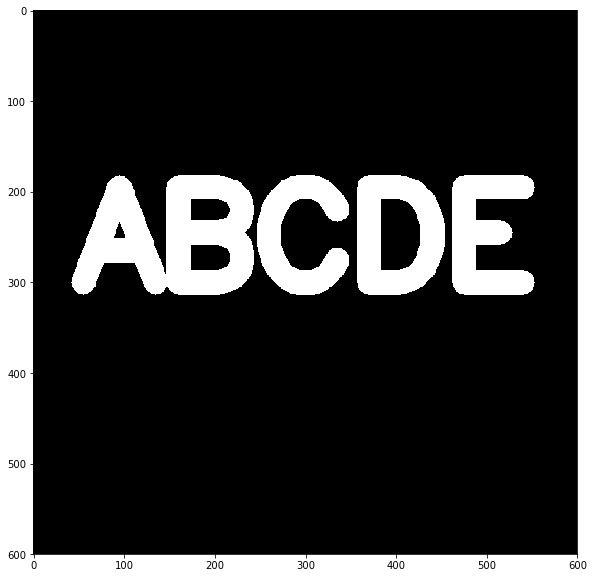

In [73]:
img = load_image()
display_img(img)

In [74]:
kernel =np.ones((5,5),dtype = np.uint8)

In [75]:
kernel 

array([[1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1]], dtype=uint8)

In [76]:
# when we increase the iterations the erosion will decrease 
# يعنى لو بصينا على الحروف الاولى هلاقى ان التلامس بينهم هايقل كل ما نزود ال iterations  
result = cv2.erode(img , kernel , iterations = 4)

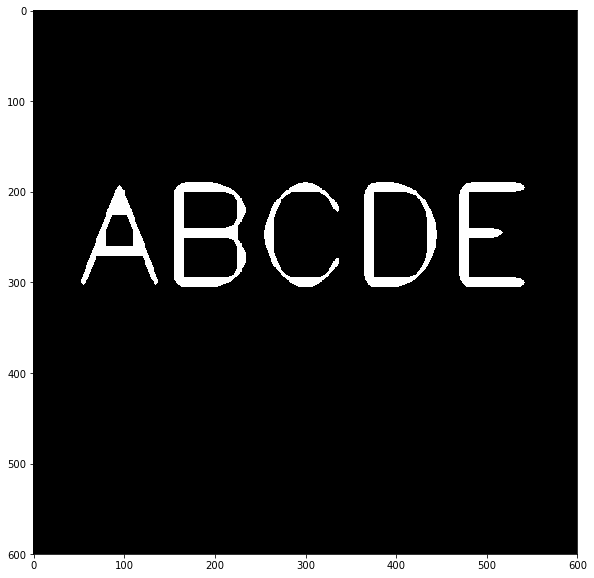

In [77]:
display_img(result)

In [78]:
white_noise = np.random.randint(low =0 ,high = 2 , size=(600,600))

In [79]:
white_noise

array([[0, 1, 1, ..., 0, 1, 1],
       [0, 1, 1, ..., 1, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 1, 1, ..., 1, 0, 0],
       [0, 1, 0, ..., 1, 1, 0],
       [1, 0, 1, ..., 0, 0, 1]])

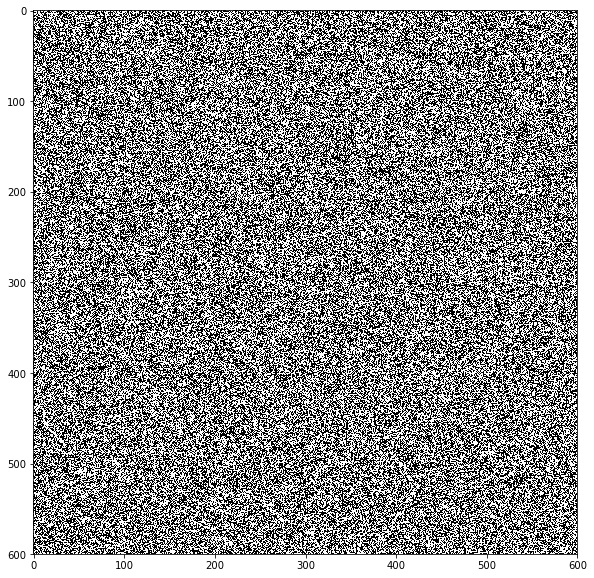

In [80]:
display_img(white_noise)

In [81]:
white_noise = white_noise *255

In [82]:
white_noise

array([[  0, 255, 255, ...,   0, 255, 255],
       [  0, 255, 255, ..., 255,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       ...,
       [  0, 255, 255, ..., 255,   0,   0],
       [  0, 255,   0, ..., 255, 255,   0],
       [255,   0, 255, ...,   0,   0, 255]])

In [83]:
noise_img = white_noise +img

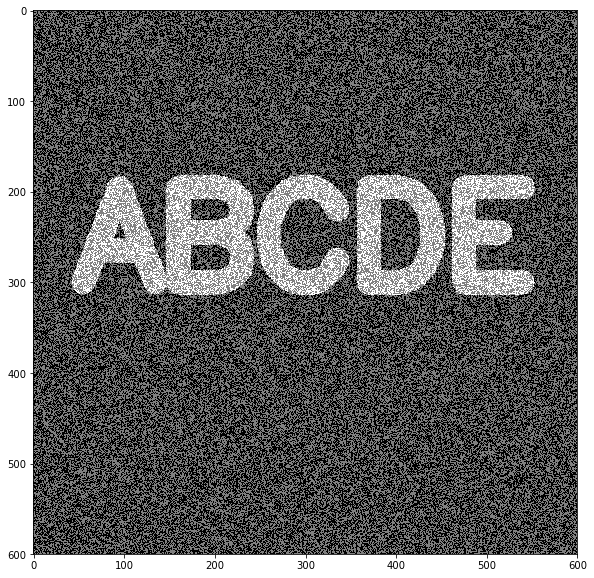

In [84]:
display_img(noise_img)

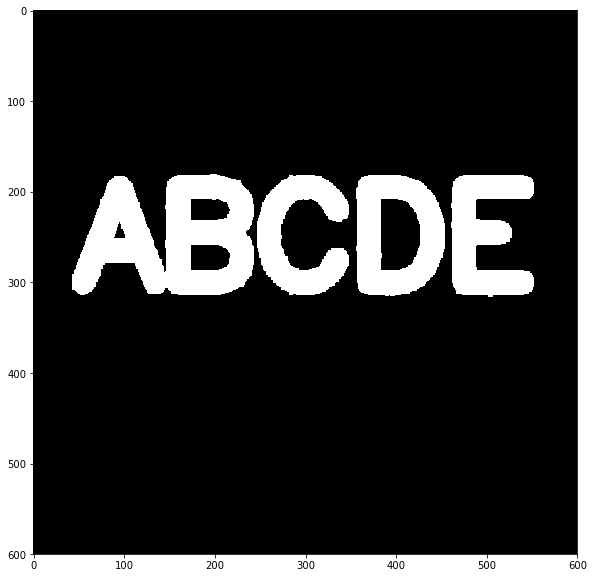

In [85]:
# OPENING MEANS EROSION FOLLOWED BY DILATION 
# MORPHOLOGYEX -----> BY MORPH_OPEN WILL CANCEL EACH OF THE NOISE IN THE IMAGE 
opening = cv2.morphologyEx(noise_img,cv2.MORPH_OPEN , kernel)
display_img(opening)

In [86]:
img = load_image()

In [87]:
black_noise = np.random.randint(low = 0,high = 2,size = (600,600))


In [88]:
black_noise =black_noise*-255

In [89]:
black_noise_img = black_noise+img

In [90]:
black_noise_img[black_noise_img==-255] = 0

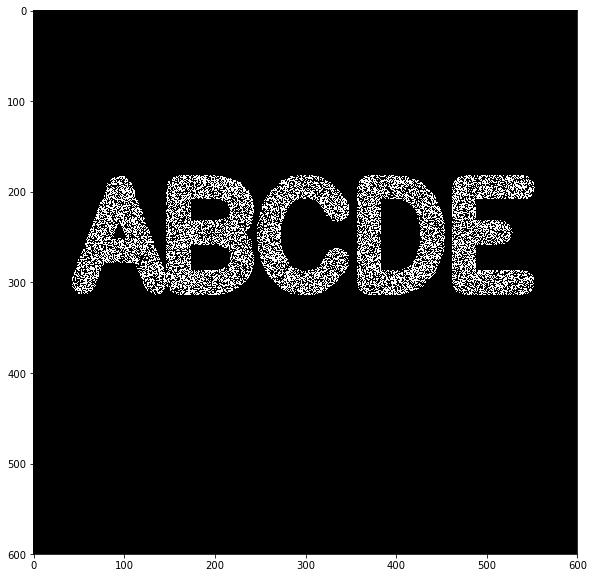

In [91]:
display_img(black_noise_img)

# CLOSING
# Useful in removing noise from foreground objects, such as black dots on top of the white text.

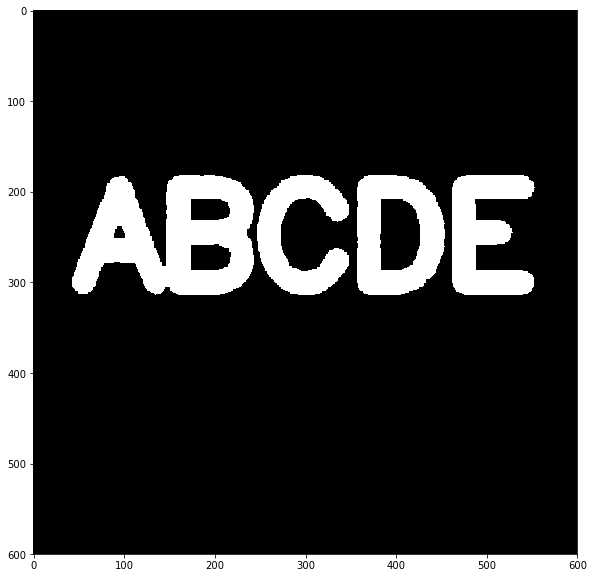

In [92]:
closing = cv2.morphologyEx(black_noise_img,cv2.MORPH_CLOSE,kernel)
display_img(closing)

## MOROPHOLOGICAL GRADIENT 
###### IT GIVES US THE DIFFERENCE BETWEEN DILATION AND EROSION 
###### it helps in edge detection

In [93]:
img = load_image()

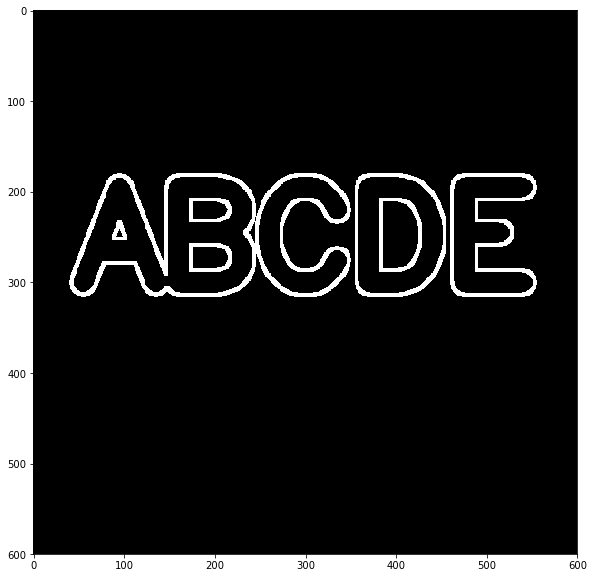

In [94]:
grad = cv2.morphologyEx(img , cv2.MORPH_GRADIENT,kernel)
display_img(grad)

## GRADIENT

In [4]:
img = cv2.imread('DATA/sudoku.jpg',0)

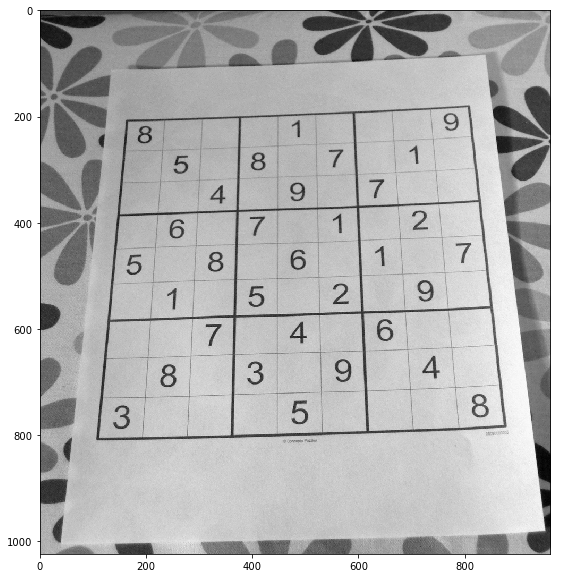

In [5]:
display_img(img)

In [6]:
sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize = 5)

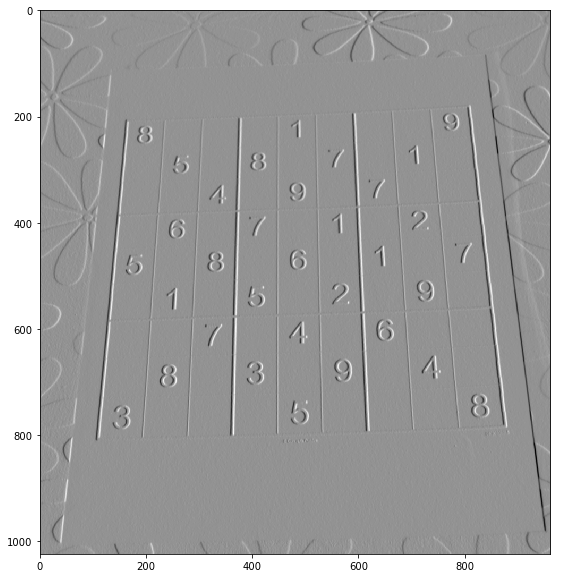

In [7]:
display_img(sobelx)

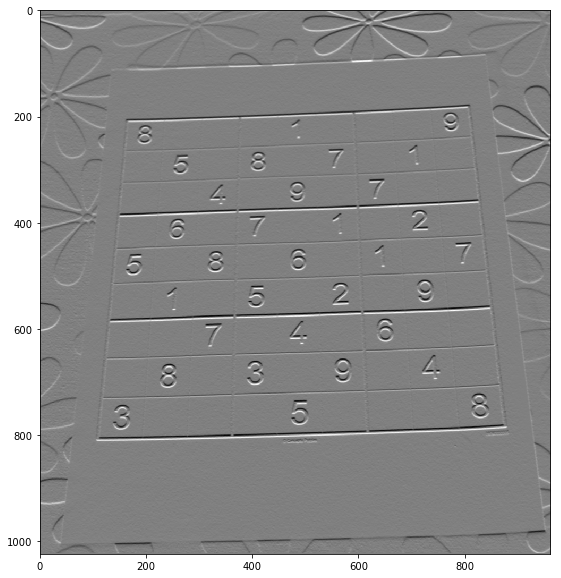

In [8]:
sobely = cv2.Sobel(img,cv2.CV_64F,0,1,ksize = 5)
display_img(sobely)

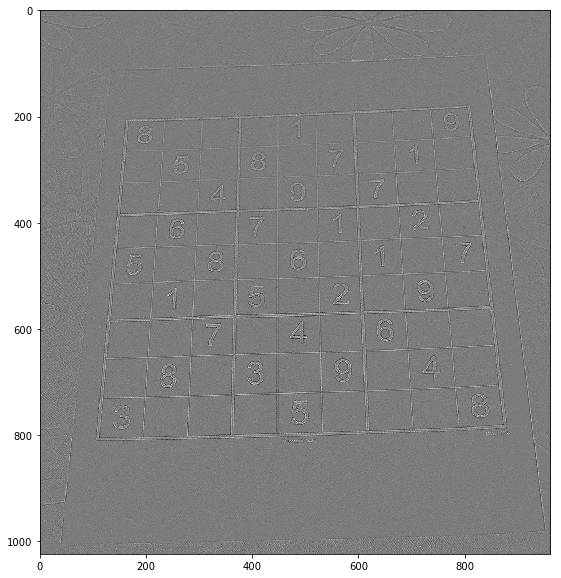

In [9]:
laplacian = cv2.Laplacian(img,cv2.CV_64F)
display_img(laplacian)

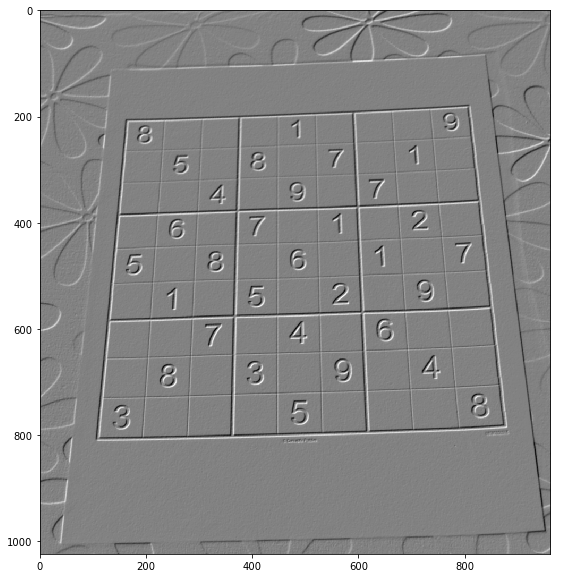

In [10]:
blended = cv2.addWeighted(src1 = sobelx , alpha=0.5,src2=sobely ,beta = 0.5,gamma = 0)
display_img(blended)

In [11]:
kernel = np.ones((4,4),np.uint8)

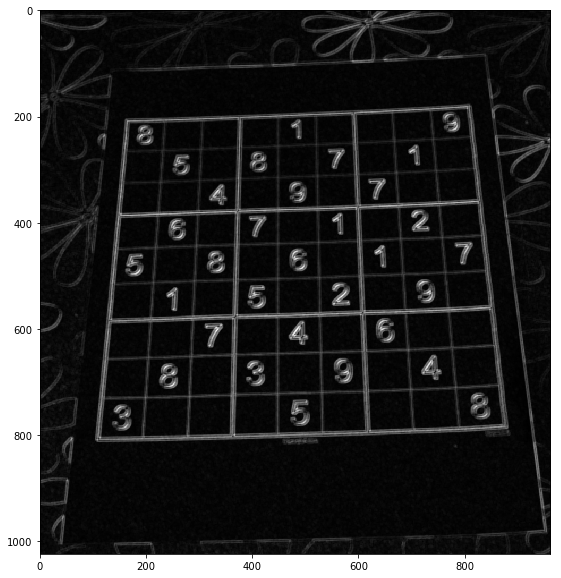

In [12]:
grad = cv2.morphologyEx(blended,cv2.MORPH_GRADIENT,kernel)
display_img(grad)

## HISTOGRAMS

In [13]:
# we have 2 variables for each image because we will make our calculations on the BGR image(original)
# the second variable is to show them
dark_horse = cv2.imread('DATA/horse.jpg')
show_horse = cv2.cvtColor(dark_horse, cv2.COLOR_BGR2RGB)

rainbow = cv2.imread('DATA/rainbow.jpg')
show_rainbow =cv2.cvtColor(rainbow, cv2.COLOR_BGR2RGB)


blue_bricks = cv2.imread('DATA/bricks.jpg')
show_bricks = cv2.cvtColor(blue_bricks, cv2.COLOR_BGR2RGB)

In [14]:
hist_values=cv2.calcHist([blue_bricks],channels = [0],mask = None,histSize = [256],ranges = [0,256])

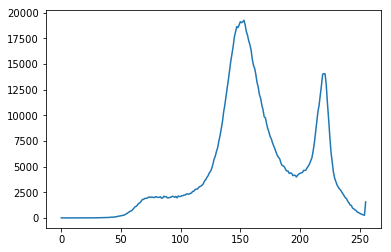

In [15]:
plt.plot(hist_values)

In [16]:
hist_values=cv2.calcHist([dark_horse],channels = [0],mask = None,histSize = [256],ranges = [0,256])

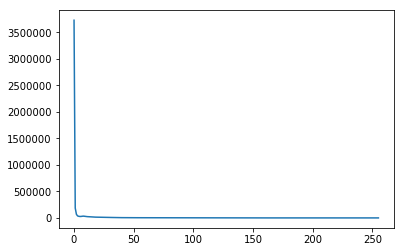

In [17]:
plt.plot(hist_values)

In [18]:
img = blue_bricks


Text(0.5,1,'HISTOGRAM FOR BLUE BRICKS')

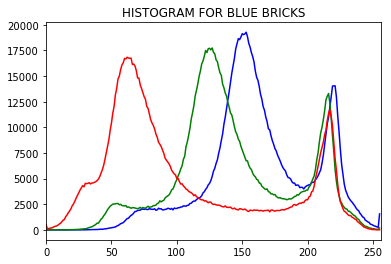

In [19]:
color = ('b','g','r')

for i,col in enumerate(color):
    histr = cv2.calcHist([img],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
    
plt.title('HISTOGRAM FOR BLUE BRICKS')
    
    

In [20]:
img1 = dark_horse

Text(0.5,1,'HISTOGRAM FOR dark horse')

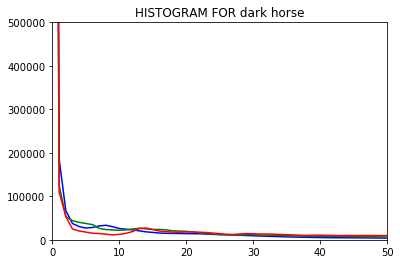

In [22]:
color = ('b','g','r')

for i,col in enumerate(color):
    histr = cv2.calcHist([img1],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,50])
    plt.ylim([0,500000])
    
plt.title('HISTOGRAM FOR dark horse')
    
    

In [23]:
# we increase and decrease the contrast of an image using histogram equalization

img =rainbow

In [24]:
img.shape

(550, 413, 3)

In [25]:
mask = np.zeros(img.shape[:2],np.uint8)

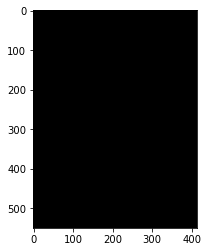

In [26]:
plt.imshow(mask,cmap = 'gray')

In [28]:
mask[300:400,100:400]=255

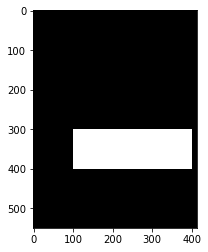

In [29]:
plt.imshow(mask,cmap = 'gray')

In [30]:
masked_img = cv2.bitwise_and(img,img,mask=mask)

In [31]:
show_mask_img  = cv2.bitwise_and(show_rainbow,show_rainbow,mask=mask)

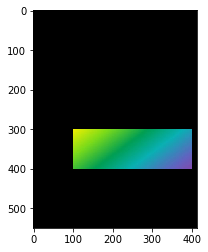

In [32]:
plt.imshow(show_mask_img)

In [34]:
hist_mask_values_red = cv2.calcHist([rainbow] , channels = [2],mask =mask,histSize = [256],ranges =[0,256])

Text(0.5,1,'RED HISTOGRAM FOR MASKED RAINBOW')

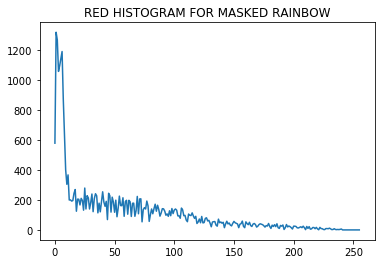

In [35]:
plt.plot(hist_mask_values_red)
plt.title('RED HISTOGRAM FOR MASKED RAINBOW')

Text(0.5,1,'RED HISTOGRAM FOR NORMAL RAINBOW')

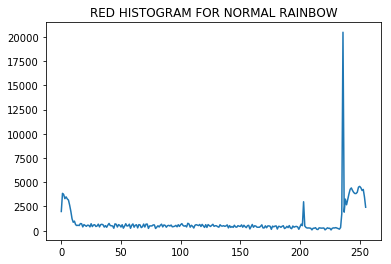

In [36]:
hist_mask_values_red = cv2.calcHist([rainbow] , channels = [2],mask =None,histSize = [256],ranges =[0,256])
plt.plot(hist_mask_values_red)
plt.title('RED HISTOGRAM FOR NORMAL RAINBOW')

In [37]:
gorilla = cv2.imread('DATA/gorilla.jpg' , 0)

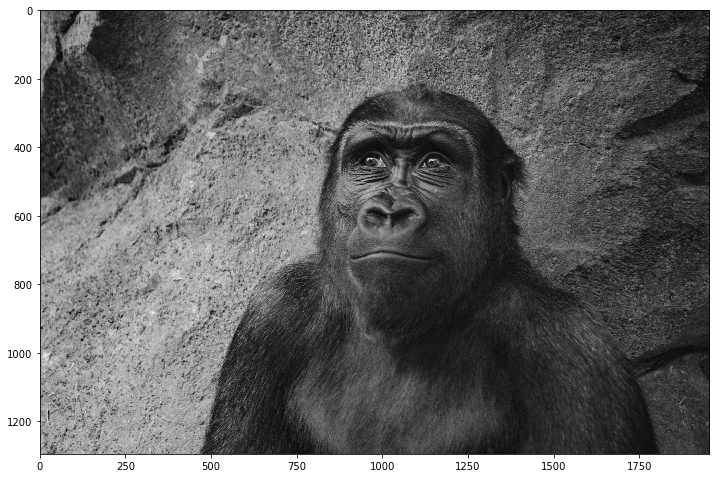

In [38]:
display_img(gorilla)

In [39]:
hist_values = cv2.calcHist([gorilla],channels = [0],mask =None ,histSize =[256],ranges = [0,256])

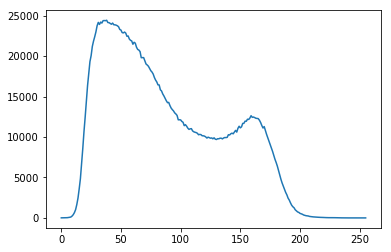

In [40]:
plt.plot(hist_values)

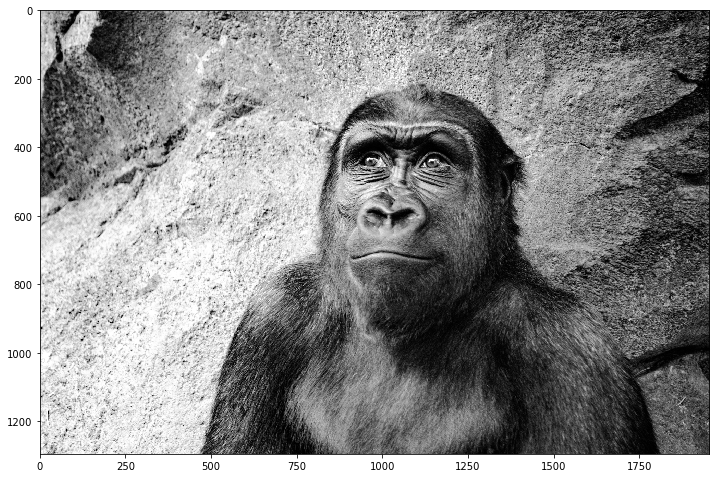

In [41]:
eq_gorilla = cv2.equalizeHist(gorilla)
display_img(eq_gorilla)

In [42]:
hist_values = cv2.calcHist([eq_gorilla],channels = [0],mask =None ,histSize =[256],ranges = [0,256])

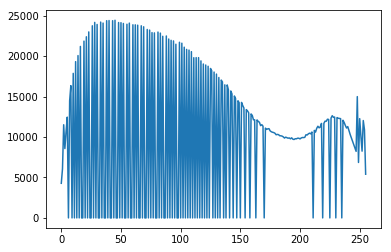

In [43]:
plt.plot(hist_values)

In [45]:
color_gorilla = cv2.imread('DATA/gorilla.jpg')
show_gorilla = cv2.cvtColor(color_gorilla,cv2.COLOR_BGR2RGB)
# Convert to HSV colorspace
hsv = cv2.cvtColor(color_gorilla, cv2.COLOR_BGR2HSV)

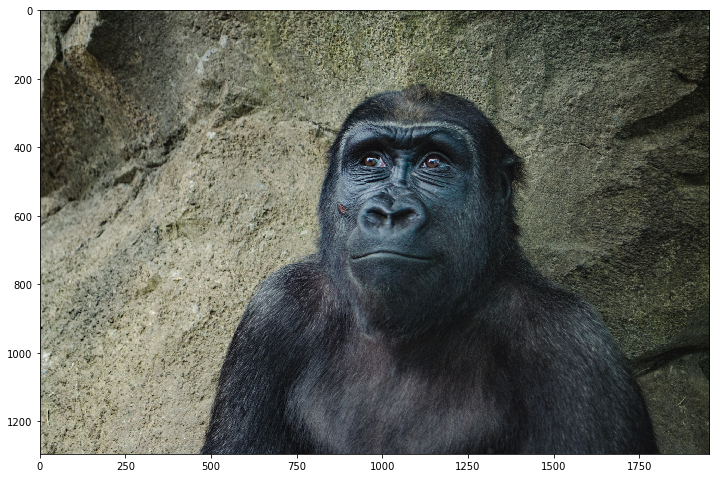

In [46]:
display_img(show_gorilla)

In [47]:
# Grab V channel
hsv[:,:,2]

array([[127, 121, 115, ...,  43,  42,  42],
       [121, 124, 123, ...,  47,  49,  51],
       [118, 129, 131, ...,  47,  50,  53],
       ...,
       [196, 197, 184, ...,  55,  55,  55],
       [184, 185, 182, ...,  51,  52,  53],
       [173, 170, 173, ...,  49,  50,  50]], dtype=uint8)

In [48]:
hsv[:,:,2] = cv2.equalizeHist(hsv[:,:,2])

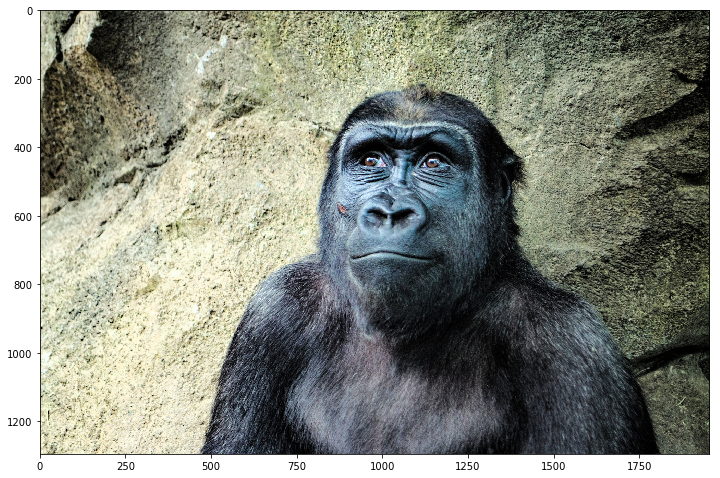

In [49]:
# Convert back to RGB to visualize
eq_color_gorilla = cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)
display_img(eq_color_gorilla)